# Introduction

---

## 1. Iterative refinement: coarse to fine as multi-task learning

In our previous model with an autoencoder with partial convolutions, we observed reasonably good reconstruction, though we noted that the output image was blurry and occasionally suffered from discolouration.

While one cause from that is likely to do with the choice of L2 as a loss function - since its gradients promote approximate estimates rather than exact - another can be due to the way the model is learning. We saw feature maps in the downsampling arm captured largely feature and later semantic information

## 2. Staggered loss functions

# Initialization

## Imports

In [20]:
# functional
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, Subset
import pandas as pd
import numpy as np
import os
from sklearn.model_selection import train_test_split
import time

# visualization
import matplotlib.pyplot as plt

# images
from skimage import io
from skimage import transform

# metrics
import torchmetrics


## Import custom methods

In [21]:
import sys
sys.path.append("/home/e/e0425222/CS4243/")
from utils.dataset_utils.AnimalDataset import AnimalDataset
from utils.train_utils.train_utils import visualize_results, sample_batch

# Model

## Define model
Here, we define five main classes to encapsulate the logic:
 1. `GatedConv2d` 
 2. `GatedConv2dBlock`
 3. `Conv2dBlock`
 4. `Conv2dPixelShuffleUpsample`
 5. `GatedConvUNet` class that encapsulates the main model.

 

In [22]:
class GatedConv2d(nn.Module):

    """
    This class implements a gated convolution. It works by applying a convolution filter 
    to the input feature tensor, then using the sigmoid function to map each score to a 
    pixel validity weight. The weights are then multiplied to the activation map from a 
    separate convolution filter.
    """

    def __init__(self, in_channels, out_channels, kernel_size, stride, padding):
        super(GatedConv2d, self).__init__()
        self.image_conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.gate_conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.sigmoid = nn.Sigmoid()

    def forward(self, input_tensor, return_mask = False):

        mask = self.sigmoid(self.gate_conv(input_tensor))
        x = self.image_conv(input_tensor)
        x = torch.mul(x, mask) # apply mask

        if return_mask:
            return x, mask

        return x


class GatedConv2dBlock(nn.Module):
    """
    This class encapsulates the following:
    GatedConv2d -> BN -> activation
    """
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding, activation = nn.ReLU, p = 0.2):
        super(GatedConv2dBlock, self).__init__()
        self.conv = GatedConv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.bn = nn.BatchNorm2d(num_features = out_channels)
        self.activation = activation()
    
    def forward(self, input_tensor, return_mask = False):
        if return_mask:
            x, mask = self.conv(input_tensor)
        else:
            x = self.conv(input_tensor)

        x = self.bn(x)
        x = self.activation(x)

        if return_mask:
            return x, mask
            
        return x


class Conv2dBlock(nn.Module):
    """
    This class encapsulates the following:
    Conv2d -> BN -> activation
    """
    def __init__(self, in_channels, out_channels, kernel_size, stride, padding, activation = nn.ReLU, p = 0.2):
        super(Conv2dBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.bn = nn.BatchNorm2d(num_features = out_channels)
        self.activation = activation()
    
    def forward(self, input_tensor):
        x = self.conv(input_tensor)
        x = self.bn(x)
        x = self.activation(x)

        return x

class GatedConv2dPixelShuffleUpsample(nn.Module):
    """
    This class encapsulates a convolution layer using GatedConv
    and PixelShuffling to upsample. Returns same number of channels, with
    output spatial dimensions scaled.
    """

    def __init__(self, in_channels, out_channels, kernel_size, stride, padding, activation = nn.ReLU, upscale_factor = 2):

        super(GatedConv2dPixelShuffleUpsample, self).__init__()
        self.conv_lr = GatedConv2dBlock(in_channels, upscale_factor ** 2 * in_channels, kernel_size = 3, stride = 1, padding = 'same')
        self.upsample = nn.PixelShuffle(upscale_factor = upscale_factor)
        self.conv = GatedConv2dBlock(in_channels, out_channels, kernel_size, stride, padding)
    
    def forward(self, input_tensor):
        
        x = self.conv_lr(input_tensor)
        x = self.upsample(x)
        x = self.conv(x)
        return x


class GatedConvAE(nn.Module):
    """
    This class encapsulates a UNet-like model with gated convolution blocks and residual skips.
    """
    
    def __init__(self, 
                 blocks_per_layer = 2,
                 in_channels = 4, 
                 hidden_channels = 32, 
                 kernel_size = 3, 
                 stride = 1, 
                 padding = 'same',
                 activation = nn.ReLU):

        super(GatedConvAE, self).__init__()

        # ===== DOWNSAMPLING =====
        
        # first convolution
        self.first = GatedConv2dBlock(in_channels, hidden_channels, kernel_size, stride, padding, activation)

        # convolutions
        self.down_1 = nn.ModuleList(
            [GatedConv2dBlock(hidden_channels, hidden_channels, kernel_size, stride, padding, activation) 
             for i in range(blocks_per_layer)])

        self.down_2 = nn.ModuleList(
            [GatedConv2dBlock(hidden_channels, hidden_channels, kernel_size, stride, padding, activation) 
             for i in range(blocks_per_layer)])        

        self.down_3 = nn.ModuleList(
            [GatedConv2dBlock(hidden_channels, hidden_channels, kernel_size, stride, padding, activation) 
             for i in range(blocks_per_layer)])  
        
        # downsampling by convolution
        self.downtransform_1 = GatedConv2dBlock(hidden_channels, hidden_channels, kernel_size = 4, stride = 2, padding = 1, activation = activation)
        self.downtransform_2 = GatedConv2dBlock(hidden_channels, hidden_channels, kernel_size = 4, stride = 2, padding = 1, activation = activation)
        self.downtransform_3 = GatedConv2dBlock(hidden_channels, 2 * hidden_channels, kernel_size = 4, stride = 2, padding = 1, activation = activation)

        # ===== MIDDLE =====
        
        self.middle = nn.ModuleList(
            [GatedConv2dBlock(2 * hidden_channels, 2 * hidden_channels, kernel_size, stride, padding, activation) 
             for i in range(blocks_per_layer)])  
        

        # ===== UPSAMPLING =====
        # upsample and convolution, always doubling
        self.uptransform_1 = GatedConv2dPixelShuffleUpsample(2 * hidden_channels, hidden_channels, kernel_size, stride, padding, activation, upscale_factor = 2)
        self.uptransform_2 = GatedConv2dPixelShuffleUpsample(hidden_channels, hidden_channels, kernel_size, stride, padding, activation, upscale_factor = 2)
        self.uptransform_3 = GatedConv2dPixelShuffleUpsample(hidden_channels, hidden_channels, kernel_size, stride, padding, activation, upscale_factor = 2)

        # convolutions
        self.up_1 = nn.ModuleList(
            [GatedConv2dBlock(hidden_channels, hidden_channels, kernel_size, stride, padding, activation) 
             for i in range(blocks_per_layer)])
        
        self.up_2 = nn.ModuleList(
            [GatedConv2dBlock(hidden_channels, hidden_channels, kernel_size, stride, padding, activation) 
             for i in range(blocks_per_layer)])
        
        self.up_3 = nn.ModuleList(
            [GatedConv2dBlock(hidden_channels, hidden_channels, kernel_size, stride, padding, activation) 
             for i in range(blocks_per_layer)])

        # final scores
        self.final = nn.Conv2d(hidden_channels, 3, kernel_size, stride, padding)

    def forward(self, input_tensor):
        
        # ===== DOWNSAMPLING =====

        # first layer
        x1 = self.first(input_tensor)
        for l in self.down_1:
            x1 = x1 + l(x1) # residual skips
        
        # second layer 
        x2 = self.downtransform_1(x1)
        for l in self.down_2:
            x2 = x2 + l(x2)

        # third layer 
        x3 = self.downtransform_2(x2)
        for l in self.down_3:
            x3 = x3 + l(x3)

        # ===== BOTTOM ====
        x = self.downtransform_3(x3)
        for l in self.middle:
            x = x + l(x)

        # ===== UPSAMPLING =====

        # first layer
        x = self.uptransform_1(x)
        for l in self.up_1:
            x = x + l(x)
        
        # second layer 
        x = self.uptransform_2(x)
        for l in self.up_2:
            x = x + l(x)

        # third layer
        x = self.uptransform_3(x)
        for l in self.up_3:
            x = x + l(x)

        # ===== FINAL =====
        x = self.final(x)
        return x 


    def summary(self, verbose = False):
        count = 0
        if verbose:
            print(self)

        for name, params in self.named_parameters():
            num_params = params.flatten().size()[0]
            count += num_params
            if verbose:
                print(f"\nlayer: {name}")
                print(f"number of params: {num_params}")
                print(f"params shape: {params.size()}")

        print(f"model has {count/1e6} million parameters")


class GatedConvAEIterative(nn.Module):
    
    def __init__(self, 
                 blocks_per_layer = 2,
                 in_channels = 4, 
                 hidden_channels = 32, 
                 kernel_size = 3, 
                 stride = 1, 
                 padding = 'same',
                 activation = nn.ReLU):
        super(GatedConvAEIterative, self).__init__()

        self.coarse = GatedConvAE(blocks_per_layer,
                                  in_channels, 
                                  hidden_channels, 
                                  kernel_size, 
                                  stride, 
                                  padding,
                                  activation)

        self.fine = GatedConvAE(blocks_per_layer,
                                in_channels + 3, 
                                hidden_channels, 
                                kernel_size, 
                                stride, 
                                padding,
                                activation)

    def forward(self, input_tensor, both = True):

        coarse = self.coarse(input_tensor)
        x = torch.cat([coarse, input_tensor], dim = 1) # cat in channel dimension
        fine = self.fine(x)

        if not both:
            return fine
            
        return coarse, fine
        

    def summary(self, verbose = False):
        count = 0
        if verbose:
            print(self)

        for name, params in self.named_parameters():
            num_params = params.flatten().size()[0]
            count += num_params
            if verbose:
                print(f"\nlayer: {name}")
                print(f"number of params: {num_params}")
                print(f"params shape: {params.size()}")

        print(f"model has {count/1e6} million parameters")


## Initialize model
Note that there is a significant difference in the depth (and thus, number of parameters) in the model. There are equivalently 17 layers in this model, relative to the 10 in the original CNN model.

In [23]:
# model parameters
blocks_per_layer = 1
in_channels = 4
hidden_channels = 32
kernel_size = 3
stride = 1
padding = 'same'
activation = nn.PReLU

# create model
model = GatedConvAEIterative(blocks_per_layer,
                            in_channels, 
                            hidden_channels, 
                            kernel_size, 
                            stride, 
                            padding,
                            activation)
model.summary(verbose = False)


model has 1.67926 million parameters


## Save model

In [24]:
MODEL_FOLDER = "/home/e/e0425222/CS4243/model_weights/GatedConvPixelShuffleAEIterative"

In [25]:
# save path
MODEL_NAME = "GatedConvPixelShuffleAEIterative_3downup_1blocksperlayer_32hidden_prelu"
SAVE_PATH = f"{MODEL_FOLDER}/{MODEL_NAME}"

# save
torch.save(model.state_dict(), SAVE_PATH)

# sanity check
loaded = GatedConvAEIterative(blocks_per_layer,
                             in_channels, 
                             hidden_channels, 
                             kernel_size, 
                             stride, 
                             padding,
                             activation)

loaded.load_state_dict(torch.load(SAVE_PATH))
loaded.summary()
del loaded

model has 1.67926 million parameters


# Training Details
For training, we define all details here, and wrap it into two main dictionaries, `training_params` and `metrics`.

## Custom loss function

In [26]:
def mask_segmented_loss(output, target, mask, loss_function = nn.functional.mse_loss):
    """
    This is a custom functional loss function that considers where the mask is, and
    applies the loss function seperately. 
    """
    
    LOSS = loss_function # can use l1 loss or coarse to fine refinement


    def weighted_sum():
        MASKED_WEIGHT = 10
        UNMASKED_WEIGHT = 1

        # weights by mask, unmasked as 1
        masked_weights = (mask - 1) * -1 * MASKED_WEIGHT # invert the mask in a differentiable way
        unmasked_weights = mask * UNMASKED_WEIGHT
        
        # weighted sum
        loss_masked = LOSS(output, target, reduction = 'none')
        loss_unmasked = LOSS(output, target, reduction = 'none')
        loss = torch.mul(loss_masked, masked_weights) + torch.mul(loss_unmasked, unmasked_weights)
        loss = torch.mean(loss)
        return loss

    def only_masked():
        loss = LOSS(output, target, reduction = 'none')
        loss = torch.mul(loss, (-mask + 1))
        loss = torch.sum(loss)/torch.sum(-mask + 1)
        return loss

    # only masked
    loss = weighted_sum()

    return loss

def coarse_fine_mask_segmented_loss(coarse_output, fine_output, target, mask):

    COARSE_WEIGHT = 1
    FINE_LOSS = 1

    coarse_loss = mask_segmented_loss(coarse_output, target, mask, loss_function = nn.functional.mse_loss) * COARSE_WEIGHT
    fine_loss = mask_segmented_loss(fine_output, target, mask, loss_function = nn.functional.l1_loss) * FINE_LOSS

    return coarse_loss + fine_loss


## Training parameters


In [27]:
# device
device = 'cuda:3'  
model = model.to(device)

# define training parameters
num_epochs = 20
batch_size = 32

# optimizer parameters
learning_rate = 1e-3
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 1, threshold = 1e-6)

# loss function 
loss_function = coarse_fine_mask_segmented_loss

# wrap into dictionary
training_params = {
    "num_epochs" : num_epochs,
    "batch_size" : batch_size, 
    "learning_rate": learning_rate,
    "optimizer" : optimizer,
    "scheduler" : scheduler,
    "schedule_every" : 1,
    "loss_function" : loss_function,
    "save_path" : SAVE_PATH
}



## Metrics

In [28]:
# define metrics
metrics = {
    "Multiscale structural similarity index measure" : torchmetrics.functional.multiscale_structural_similarity_index_measure,
    "Peak SnR" : torchmetrics.functional.peak_signal_noise_ratio,
    "L2 loss" : nn.functional.mse_loss,
    "L1 loss" : nn.functional.l1_loss
}

## Load Frogs dataset

In [29]:
dataset = AnimalDataset(index_file_path = "/home/e/e0425222/CS4243/dataset/frogs/frogs_wanted_indices_url.txt",
                        root_dir_path = "/home/e/e0425222/CS4243/dataset/frogs/images",
                        local_dir_path = "/home/e/e0425222/CS4243/dataset/frogs/preprocessed",
                        file_prefix = "frog_",
                        image_dimension = 256,
                        concat_mask = True)

dataset.initialize()

# train-test split
VALID_SIZE = 0.2
NUM_WORKERS = 2

indices = torch.arange(len(dataset))
train_indices, validation_indices = train_test_split(indices, test_size = VALID_SIZE)
train_dataset = Subset(dataset, train_indices)
validation_dataset = Subset(dataset, validation_indices)


Cleaning ...
Cleaning completed. Dropped 1 files. Took 1.3899398485819499 min
The row indices dropped were [3839]


In [30]:
# sample_batch(dataset, sample_size = 16)
# sample_batch(train_dataset, sample_size = 16)
# sample_batch(validation_dataset, sample_size = 16)

# Training

## Helper functions

In [31]:
def train_epoch(model, device, train_dataloader, training_params : dict, metrics : dict):
    """
    This method encapsulates the training of a given model for one epoch. 
    
    @param model : nn.Module                        Model to be trained.
    @param device : str                             Device to be trained on.
    @param train_dataloader : nn.data.DataLoader    DataLoader object to load batches of data.
    @param training_params : dict                   Dictionary object mapping names of 
                                                    training utilities to their respective objects.
                                                    Required are "batch_size", "loss_function", 
                                                    and "optimizer". 
    @param metrics : dict                           Dictionary object mapping names of 
                                                    metrics to a functional method that 
                                                    would compute the metric value.
    """
    
    # ===== INITIALIZE =====
    # constants
    BATCH_SIZE = training_params["batch_size"]
    LOSS_FUNCTION = training_params["loss_function"]
    OPTIMIZER = training_params["optimizer"]
    BATCH_EVALUATE_EVERY = 1

    # model to device
    model = model.to(device)
    model.train()

    # epoch metrics
    running_results = {list(metrics.keys())[i] : 0.0 for i in range(len(metrics)) } 
    running_results["loss"] = 0.0

    # ===== TRAIN EPOCH =====
    num_batches = 0
    for index, batch in enumerate(train_dataloader, 1):

            # ===== INITIALIZE =====
            num_batches += 1

            # input and ground truth
            input_batched = batch["image"]
            ground_truth_batched = batch["reconstructed"]
            mask_batched = batch["mask"]

            # sanity check
            assert input_batched.shape[0] == ground_truth_batched.shape[0]

            # move tensors to device
            input_batched = input_batched.to(device)
            ground_truth_batched = ground_truth_batched.to(device)
            mask_batched = mask_batched.to(device)

            # Set the gradients to zeros
            OPTIMIZER.zero_grad()

            # ===== FORWARD PASS =====
            # reshape to channel first
            input_batched = input_batched.permute(0, 3, 1, 2)
            ground_truth_batched = ground_truth_batched.permute(0, 3, 1, 2)
            mask_batched = mask_batched.permute(0, 3, 1, 2)

            # forward pass
            input_batched.requires_grad_()
            coarse_batched, output_batched = model(input_batched)

            # ===== BACKPROP =====

            loss = LOSS_FUNCTION(coarse_batched, output_batched, ground_truth_batched, mask_batched)
            loss.backward()
            OPTIMIZER.step()

            # ===== COMPUTE STATISTICS, USING TORCH METRICS =====  
            # for each key, compute, add item to results dictionary
            running_results["loss"] += loss.detach().item()
            for key, func in metrics.items():
                running_results[key] += func(output_batched, ground_truth_batched).detach().item()

            # ===== HOUSEKEEPING =====
            del loss
            del input_batched
            del output_batched

            # print results every some batches
            if num_batches % BATCH_EVALUATE_EVERY == 0: 

                args = ""
                for key, val in running_results.items():
                    args += key + ": " + str(running_results[key]/num_batches) + "   "
                print(f"\r{num_batches}/{len(train_dataloader)}: " + args, end = '', flush = True)

    # normalise numbers by batch
    for key, val in running_results.items():
        running_results[key] /= num_batches

    return running_results



In [32]:
def evaluate_epoch(model, device, validation_dataloader, training_params : dict, metrics : dict):
    """
    This method encapsulates the evaluation of a given model for one epoch.
    
    @param model : nn.Module                            Model to be trained.
    @param device : str                                 Device to be trained on.
    @param validation_dataloader : nn.data.DataLoader   DataLoader object to load batches of data.
    @param training_params : dict                       Dictionary object mapping names of 
                                                        training utilities to their respective objects.
                                                        Required are "batch_size", "loss_function", 
                                                        and "optimizer". 
    @param metrics : dict                               Dictionary object mapping names of 
                                                        metrics to a functional method that 
                                                        would compute the metric value.
    """
    
    # ===== INITIALIZE =====
    # constants
    BATCH_SIZE = training_params["batch_size"]
    LOSS_FUNCTION = training_params["loss_function"]
    OPTIMIZER = training_params["optimizer"]

    # to device
    model = model.to(device)

    # epoch statistics
    running_results = {list(metrics.keys())[i] : 0.0 for i in range(len(metrics)) } 
    running_results["loss"] = 0.0

    # ===== EVALUATE EPOCH =====

    with torch.no_grad():
        model.eval()
        batches = 0
        for index, batch in enumerate(validation_dataloader, 1):
            
            batches += 1

            # input and ground truth
            input_batched = batch["image"]
            ground_truth_batched = batch["reconstructed"]
            mask_batched = batch["mask"]

            # move tensors to device
            input_batched = input_batched.to(device)
            ground_truth_batched = ground_truth_batched.to(device)
            mask_batched = mask_batched.to(device)

            # reshape to channel first
            input_batched = input_batched.permute(0, 3, 1, 2)
            ground_truth_batched = ground_truth_batched.permute(0, 3, 1, 2)
            mask_batched = mask_batched.permute(0, 3, 1, 2)

            # predict    
            coarse_batched, output_batched = model(input_batched)

            # evaluate
            loss = LOSS_FUNCTION(coarse_batched, output_batched, ground_truth_batched, mask_batched).detach().item()
            running_results["loss"] += loss
            
            # ===== COMPUTE STATISTICS, USING TORCH METRICS =====
            for key, func in metrics.items():
                running_results[key] += func(output_batched, ground_truth_batched).detach().item()

            args = ""
            for key, val in running_results.items():
                args += key + ": " + str(running_results[key]/batches) + "   "
            print(f"\r{batches}/{len(validation_dataloader)}: " + args, end = '', flush = True)

            # delete to ensure memory footprint
            del loss
            del input_batched
            del output_batched

    # normalise numbers by batch
    for key, val in running_results.items():
        running_results[key] /= batches

    return running_results

    

In [33]:
def train_evaluate(model, device, train_dataset, validation_dataset, training_params: dict, metrics: dict):

    """
    This method encapsulates the training and evaluation loop of a given model.
    
    @param model : nn.Module                            Model to be trained.
    @param device : str                                 Device to be trained on.
    @param train_dataloader : nn.data.DataLoader        DataLoader object to load batches of data for training.
    @param validation_dataloader : nn.data.DataLoader   DataLoader object to load batches of data for validation.
    @param training_params : dict                       Dictionary object mapping names of 
                                                        training utilities to their respective objects.
                                                        Required are "num_epochs", "batch_size", "loss_function", 
                                                        "scheduler", "save_path" and "optimizer". 
    @param metrics : dict                               Dictionary object mapping names of 
                                                        metrics to a functional method that 
                                                        would compute the metric value.
    """


    # ===== INITIALIZE =====
    # constants
    NUM_EPOCHS = training_params["num_epochs"]
    BATCH_SIZE = training_params["batch_size"]
    SCHEDULER = training_params["scheduler"]
    SAVE_PATH = training_params["save_path"]
    NUM_WORKERS = 2
    START_EPOCH = 0
    SAMPLE_SIZE = 16
    PLOT_EVERY = 1

    # variables
    train_results = {list(metrics.keys())[i] : [] for i in range(len(metrics)) } 
    train_results["loss"] = []
    eval_results = {list(metrics.keys())[i] : [] for i in range(len(metrics)) } 
    eval_results["loss"] = []

    # dataloaders
    train_dataloader = DataLoader(train_dataset, batch_size = BATCH_SIZE, shuffle = True, num_workers = NUM_WORKERS)
    validation_dataloader = DataLoader(validation_dataset, batch_size = BATCH_SIZE, shuffle = True, num_workers = NUM_WORKERS)

    # ===== TRAIN =====
    for epoch in range(NUM_EPOCHS):

        start = time.time()

        # train
        print(f"\n===== Epoch: {START_EPOCH + epoch + 1} ===== ")
        num_batches = 0

        # train every epoch
        print("\nTraining ...")
        results = train_epoch(model, device, train_dataloader, training_params, metrics)
        for key, val in results.items():
            train_results[key].append(val)

        # evaluate every epoch
        print("\nEvaluating ...")
        results = evaluate_epoch(model, device, validation_dataloader, training_params, metrics)
        for key, val in results.items():
            eval_results[key].append(val)

        # ===== EPOCH RESULTS =====
        print(f"\nCompleted epoch {START_EPOCH + epoch + 1}! Took {(time.time() - start)/60} min")

        # ===== VISUALIZE =====
        if epoch % PLOT_EVERY == 0:
            print("plotting ...")
            loader = DataLoader(validation_dataset, batch_size = SAMPLE_SIZE, shuffle = True)
            batch = next(iter(loader))

            # predict and plot
            model.eval()
            coarse, fine = model(batch["image"].to(device).permute(0, 3, 1, 2))
            coarse = coarse.detach().cpu().permute(0, 2, 3, 1)
            fine = fine.detach().cpu().permute(0, 2, 3, 1)
            fig, ax = plt.subplots(4, SAMPLE_SIZE, figsize = (SAMPLE_SIZE * 5, 20, ))
            for i in range(SAMPLE_SIZE):
                image = batch["image"][i]
                reconstructed = batch["reconstructed"][i]
                initial = coarse[i]
                predicted = fine[i]

                if image.shape[-1] > 3: 
                    image = image[:, :, 0:3] # take rgb if more than 3 channels
                    
                ax[0][i].imshow(image)
                ax[1][i].imshow(reconstructed)
                ax[2][i].imshow(initial)
                ax[3][i].imshow(predicted)
                
            plt.savefig(f"{SAVE_PATH}_epoch{epoch + 1}.png")
            print("saved plots!")
            plt.close()

        # ===== HOUSEKEEPING =====

        # scheduler every epoch
        if SCHEDULER is not None:
            SCHEDULER.step(eval_results["loss"][epoch])

        # save save every epoch
        SAVE = f"{SAVE_PATH}_epoch{epoch + 1}.pt"
        torch.save(model.state_dict(), SAVE)
        print("saved model!")

    return train_results, eval_results

## Training

In [34]:
torch.autograd.set_detect_anomaly(True)

# train
running_train_results, running_eval_results = train_evaluate(model, device, train_dataset, validation_dataset, training_params, metrics)


===== Epoch: 1 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.744535425345103   Peak SnR: 15.683799772898356   L2 loss: 0.0380586882630984   L1 loss: 0.12056960318485896   loss: 0.6073599686622619   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.8025901571233222   Peak SnR: 15.849504196897467   L2 loss: 0.03160471035207205   L1 loss: 0.106028260623521   loss: 0.7568896010201028   
Completed epoch 1! Took 5.069769382476807 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 2 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.7556035609245301   Peak SnR: 17.894369186401367   L2 loss: 0.01637832504014174   L1 loss: 0.09246556840340296   loss: 0.3629441449642181   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.8255179327853183   Peak SnR: 17.36790823429189   L2 loss: 0.019367474388886006   L1 loss: 0.08870186672565784   loss: 0.39821338209700075   
Completed epoch 2! Took 4.961092646916708 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


saved plots!
saved model!

===== Epoch: 3 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.7800825554529826   Peak SnR: 18.980654912312826   L2 loss: 0.012764620224634806   L1 loss: 0.07980978311101596   loss: 0.28627585287888846   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.8382381352972477   Peak SnR: 18.796999911044505   L2 loss: 0.013593711053080697   L1 loss: 0.07499075019137656   loss: 0.2874310333678063   
Completed epoch 3! Took 4.874472224712372 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 4 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.8011542212168375   Peak SnR: 19.458482121785483   L2 loss: 0.011433658500512442   L1 loss: 0.07534231635928154   loss: 0.25716790413856505   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.7846274071551383   Peak SnR: 19.961276054382324   L2 loss: 0.010176398291034585   L1 loss: 0.06873554118136142   loss: 0.24661780703575054   
Completed epoch 4! Took 4.897764686743418 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 5 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.8128121314048767   Peak SnR: 19.827354156494142   L2 loss: 0.010517880310614904   L1 loss: 0.07213820828994115   loss: 0.23890636706352233   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.8330382216483989   Peak SnR: 20.20059829062604   L2 loss: 0.009637403851771292   L1 loss: 0.06623153586653953   loss: 0.22890972821636402   
Completed epoch 5! Took 4.951247851053874 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 6 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.8308088836669922   Peak SnR: 20.166916580200194   L2 loss: 0.009717997197061777   L1 loss: 0.06856871125102043   loss: 0.22612530934810637   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.8427397684848055   Peak SnR: 20.628796394835128   L2 loss: 0.008719784494965   L1 loss: 0.06217525217761385   loss: 0.21466665714979172   
Completed epoch 6! Took 5.032291014989217 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 7 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.8496912331581116   Peak SnR: 20.341957328796386   L2 loss: 0.009694282285869122   L1 loss: 0.06608756858110428   loss: 0.21577948224544524   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.8415204717757854   Peak SnR: 20.566333405514982   L2 loss: 0.008877303332407424   L1 loss: 0.06395384811974586   loss: 0.20826000593444136   
Completed epoch 7! Took 5.274210798740387 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 8 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.8571805208524068   Peak SnR: 20.787691884358726   L2 loss: 0.008444580397258202   L1 loss: 0.06279188459118207   loss: 0.20523757016658783   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.8644070327281952   Peak SnR: 20.473986382180072   L2 loss: 0.009213876003954322   L1 loss: 0.06008810256706908   loss: 0.22169528949133893   
Completed epoch 8! Took 4.740840510527293 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 9 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.863466676235199   Peak SnR: 21.01263223775228   L2 loss: 0.008000012252479791   L1 loss: 0.06105704689025879   loss: 0.19925871785481772   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.8688230210162223   Peak SnR: 21.625405128965987   L2 loss: 0.006952978680504763   L1 loss: 0.054002641957808045   loss: 0.19934781941961735   
Completed epoch 9! Took 4.8194876710573835 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 10 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.8670303098360698   Peak SnR: 21.237951985677082   L2 loss: 0.007618214428424835   L1 loss: 0.059302507996559145   loss: 0.19555503571033478   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.8985436222654708   Peak SnR: 20.96036497075507   L2 loss: 0.008372594731205956   L1 loss: 0.05483301308877925   loss: 0.1894153193273443   
Completed epoch 10! Took 4.747110831737518 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 11 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.8767180987993877   Peak SnR: 21.441600326538087   L2 loss: 0.0072608384961883226   L1 loss: 0.0574002911845843   loss: 0.19153123207887013   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.8821847667085364   Peak SnR: 21.681160358672447   L2 loss: 0.006962087183715182   L1 loss: 0.0516938346021987   loss: 0.181131419507747   
Completed epoch 11! Took 4.758275457223257 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 12 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.887480311870575   Peak SnR: 21.632170008341472   L2 loss: 0.006947335051993529   L1 loss: 0.05573157224059105   loss: 0.18728977823257445   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.8998207405526587   Peak SnR: 21.2056500252257   L2 loss: 0.007708638212940795   L1 loss: 0.05779387738476408   loss: 0.1979493314915515   
Completed epoch 12! Took 4.737021140257517 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 13 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.889836659749349   Peak SnR: 21.795494974772136   L2 loss: 0.0066896118260920045   L1 loss: 0.054588816493749616   loss: 0.18551630103588104   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.9125711429626384   Peak SnR: 20.40177387886859   L2 loss: 0.010589494023155024   L1 loss: 0.052662547281447876   loss: 0.18988492102064986   
Completed epoch 13! Took 4.7412955403327945 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 14 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.8907676097551982   Peak SnR: 22.15576426188151   L2 loss: 0.00615847626204292   L1 loss: 0.05158398970961571   loss: 0.17720190427700677   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.9169692720504518   Peak SnR: 21.78503754798402   L2 loss: 0.006993735627707174   L1 loss: 0.049183618594357305   loss: 0.17328721459241622   
Completed epoch 14! Took 4.741024239857992 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 15 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.8950449940363566   Peak SnR: 22.23105869547526   L2 loss: 0.006053161282092333   L1 loss: 0.050917995154857634   loss: 0.1771601625084877   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.9225723882938953   Peak SnR: 19.360492117861483   L2 loss: 0.019395393715735447   L1 loss: 0.0544013047709744   loss: 0.19375952047870515   
Completed epoch 15! Took 4.81033540169398 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 16 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.8945781809488932   Peak SnR: 22.280122258504232   L2 loss: 0.005981693621724844   L1 loss: 0.05066119343042374   loss: 0.17576860332489014   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.9006788293097882   Peak SnR: 22.103454569552806   L2 loss: 0.006279252405139677   L1 loss: 0.04807312679576113   loss: 0.17121221331205774   
Completed epoch 16! Took 5.179569045702617 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 17 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.8970491422017416   Peak SnR: 22.418699106852213   L2 loss: 0.005790744946648677   L1 loss: 0.04941872625549634   loss: 0.17303142948945363   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.8907199292740924   Peak SnR: 22.503188336149176   L2 loss: 0.005697222926871891   L1 loss: 0.04581698890220612   loss: 0.1706413356389137   
Completed epoch 17! Took 4.830744393666586 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 18 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.9002193751335144   Peak SnR: 22.43690135192871   L2 loss: 0.005768015012145042   L1 loss: 0.04917320094505946   loss: 0.17293890955050786   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.8938987115596203   Peak SnR: 22.378700094020115   L2 loss: 0.005825357328347386   L1 loss: 0.05031108253813805   loss: 0.17043486871617905   
Completed epoch 18! Took 4.829918992519379 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 19 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.9056829031308492   Peak SnR: 22.135401346842446   L2 loss: 0.006220219540720185   L1 loss: 0.051308682560920714   loss: 0.1762570359905561   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.896199624589149   Peak SnR: 22.57193486233975   L2 loss: 0.0055829392637106335   L1 loss: 0.04802995095861719   loss: 0.1656970925470616   
Completed epoch 19! Took 4.96195201476415 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!

===== Epoch: 20 ===== 

Training ...
375/375: Multiscale structural similarity index measure: 0.909809453010559   Peak SnR: 22.368213048299154   L2 loss: 0.005855839669083556   L1 loss: 0.049565922876199084   loss: 0.17185721965630849   
Evaluating ...
94/94: Multiscale structural similarity index measure: 0.9459831600493573   Peak SnR: 18.396011388048212   L2 loss: 0.04012700253998504   L1 loss: 0.053568155009378775   loss: 0.18690861983502166   
Completed epoch 20! Took 4.856558851401011 min
plotting ...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

saved plots!
saved model!


# Results and analysis

In [35]:
def visualize_results(model, device, running_train_results: dict, running_eval_results: dict, test_dataset = None, images_only = False):

    # get number of epochs and data points
    NUM_EPOCHS = len(list(running_train_results.values())[0])
    NUM_METRICS = len(list(running_train_results))
    assert list(running_train_results.keys()) == list(running_eval_results.keys())
    
    if not images_only:
        # plot 
        fig, ax = plt.subplots(NUM_METRICS, figsize = (NUM_EPOCHS * 5, NUM_METRICS * 5))
        epochs_axis = [i for i in range(NUM_EPOCHS)]
        index = 0
        for key in list(running_train_results.keys()):
            train = running_train_results[key]
            validation = running_eval_results[key]

            ax[index].plot(epochs_axis, train, label = "train")
            ax[index].plot(epochs_axis, validation, label = "validation")
            ax[index].title.set_text(key)
            index += 1

    if test_dataset != None:
        SAMPLE_SIZE = 8
        loader = DataLoader(test_dataset, batch_size = SAMPLE_SIZE, shuffle = True)
        batch = next(iter(loader))

        # predict
        model.eval()
        coarse, fine = model(batch["image"].to(device).permute(0, 3, 1, 2))
        coarse = coarse.detach().cpu().permute(0, 2, 3, 1)
        fine = fine.detach().cpu().permute(0, 2, 3, 1)
        fig, ax = plt.subplots(4, SAMPLE_SIZE, figsize = (SAMPLE_SIZE * 5, 20, ))
        for i in range(SAMPLE_SIZE):
            image = batch["image"][i]
            reconstructed = batch["reconstructed"][i]
            initial = coarse[i]
            predicted = fine[i]

            if image.shape[-1] > 3: 
                image = image[:, :, 0:3] # take rgb if more than 3 channels
                
            ax[0][i].imshow(image)
            ax[1][i].imshow(reconstructed)
            ax[2][i].imshow(initial)
            ax[3][i].imshow(predicted)
            
        plt.show()
        plt.close()
    

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

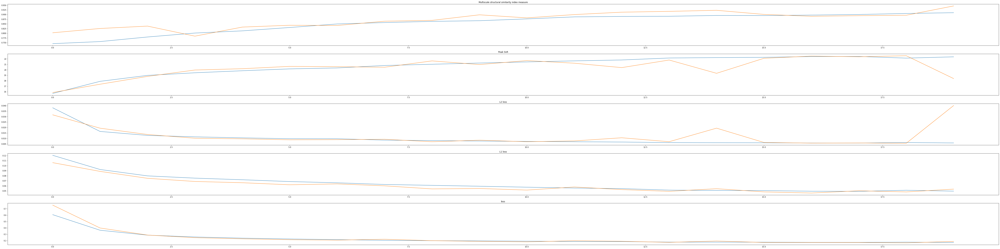

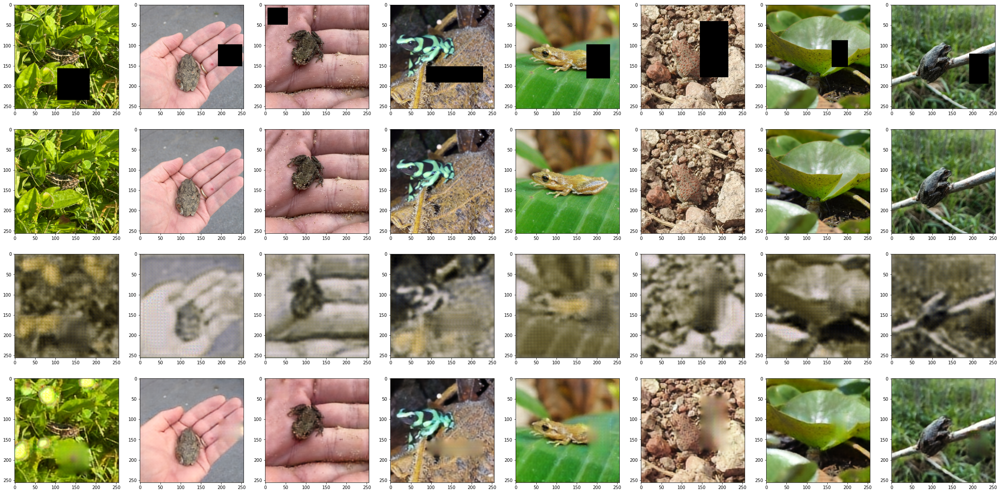

In [36]:
visualize_results(model, device, running_train_results, running_eval_results, test_dataset = validation_dataset)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

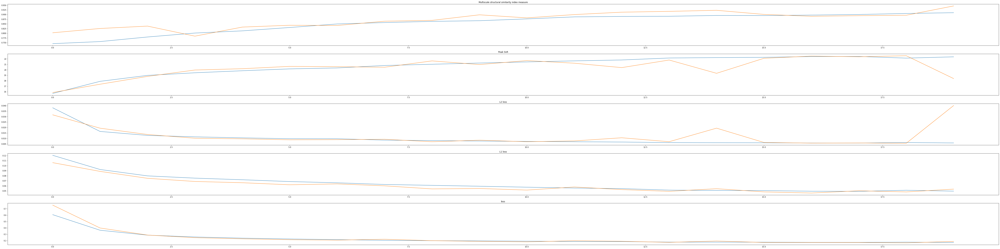

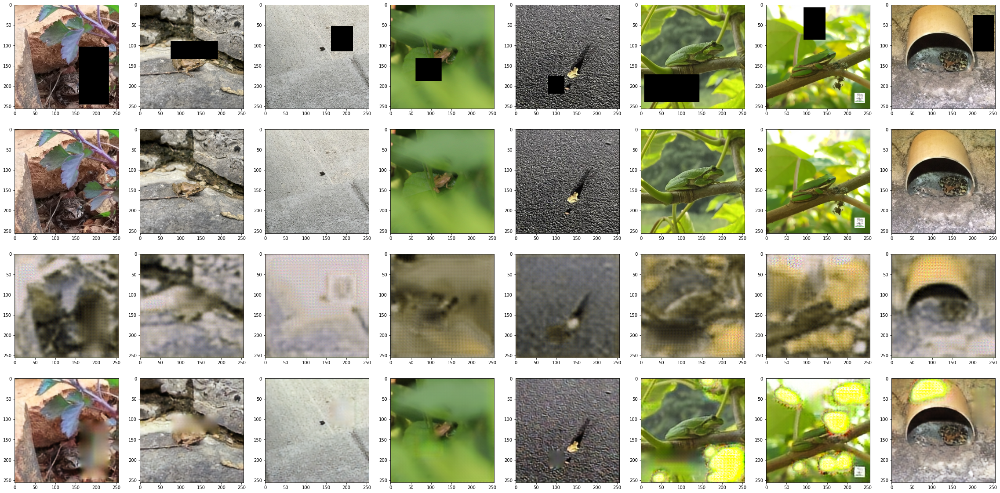

In [37]:
visualize_results(model, device, running_train_results, running_eval_results, test_dataset = validation_dataset)